# Stochastic stranding
__Суммарное количество баллов: 8__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][HW11] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

По бескрайним каменным джунглям от заказа к заказу бродят курьеры. Их задача - как можно быстрее доставить все заказы, чтобы взять новые. Ничто не может заставить их покинуть вечный цикл доставки.

In [22]:
import copy
import pandas
import random
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML
from itertools import combinations

In [89]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
#     colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    colors = get_colors([[cyclic_distance(p, hillclimb.dist) for p in permutations]], False)[0]
#     coords = get_coords([X[p] for p in permutations])
    coords = get_coords([p for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

In [190]:
def synthetic_points(count=25, dims=2):
    np.random.seed(42)
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

### Задание 1 (1 балл)
Для начала научимся считать расстояния, которые курьерам придется преодолеть. Если бы они доставляли еду в пустыне, то им бы было достаточно считать евклидовы расстояния, т.к. можно просто идти напрямик. Однако курьеры доставляют еду только в городе, и двигаться могут только вдоль улиц. Поэтому нам понадобится манхэттенское расстояние.

#### Функции
`cyclic_distance(points, dist)` - возвращает суммарное расстояние пройденное курьером по циклу из точек `points` посчитанное при помощи функции `dist`.

`l2_distance(p1, p2)` - возвраает евклидово расстояние между точками.

`l1_distance(p1, p2)` - возвращает манхэттенское расстояние между точками.

In [7]:
def cyclic_distance(points, dist):
    distance = 0.0
    
    for i in range(len(points)):
        distance += dist(points[i], points[(i + 1) % len(points)])

    return distance

def l2_distance(p1, p2):
    return np.sqrt(np.sum((p1 - p2)**2))

def l1_distance(p1, p2):
    return np.sum(np.abs(p1 - p2))

### Задание 2 (3 балла)
Курьер получил карту расположения заказов на карте. Ему хочется побыстрее обойти все точки. Для этого он хочет воспользоваться методом HillClimb, а вам предстоит ему в этом помочь. Реализуйте данный метод.

#### Методы
`optimize_explain(X)` - возвращает список из перестановок точек `X`, полученных в процессе оптимизации. Перестановка должна попадать в список после каждого изменения. Метод должен совершить не больше `max_iterations` итераций, на каждой из них необходимо рассмотреть все возможные пары индексов.

#### Параметры конструктора
`max_iterations` - максимальное количество итераций в методе `optimize_explain`

`dist` - функция расстояния

In [361]:
class HillClimb:
    def __init__(self, max_iterations, dist):
        self.max_iterations = max_iterations
        self.dist = dist # Do not change
    
    def optimize(self, X):
        return self.optimize_explain(X)[-1]
    
    def optimize_explain(self, X):
        points, N = X.copy(), X.shape[0]
        
        perm_history = []
        
        best_dist, best_perm = cyclic_distance(X, self.dist), X.copy()
        
        for t in range(self.max_iterations):
            new_best, (i, j) = self.best_swap(points, best_dist)
            
            if i is None and j is None:
                break
                
            points[[i, j]] = points[[j, i]]
            
            best_dist = new_best
            best_perm = points.copy()
            
            perm_history.append(best_perm)
            
        return perm_history
    
    def best_swap_naive(self, points, best_dist):
        N = points.shape[0]
        
        new_best, new_pair = best_dist.copy(), (None, None)
        
        for i, j in combinations(range(N), 2):
            points[[i, j]] = points[[j, i]]

            curr_dist = cyclic_distance(points, self.dist)
            if curr_dist < new_best:
                new_best, new_pair = curr_dist, (i, j)

            points[[i, j]] = points[[j, i]]
            
        return new_best, new_pair
        
    
    def best_swap(self, points, best_dist):
        N = points.shape[0]
        
        new_best, new_pair = best_dist.copy(), (None, None)

        for i, j in combinations(range(N), 2):
            if i == 0 and j == (N - 1):
                old_dist_i = self.dist(points[i], points[(i + 1) % N])
                old_dist_j = self.dist(points[j], points[(j - 1) % N])
                
                new_dist_i = self.dist(points[i], points[(j - 1) % N])
                new_dist_j = self.dist(points[j], points[(i + 1) % N])
                
            elif abs(i - j) >= 2:
                old_dist_i = self.dist(points[i], points[(i - 1) % N]) + self.dist(points[i], points[(i + 1) % N])
                old_dist_j = self.dist(points[j], points[(j - 1) % N]) + self.dist(points[j], points[(j + 1) % N])
                
                new_dist_i = self.dist(points[i], points[(j - 1) % N]) + self.dist(points[i], points[(j + 1) % N])
                new_dist_j = self.dist(points[j], points[(i - 1) % N]) + self.dist(points[j], points[(i + 1) % N])
            else:
                old_dist_i = self.dist(points[i], points[(i - 1) % N])
                old_dist_j = self.dist(points[j], points[(j + 1) % N])
                
                new_dist_i = self.dist(points[i], points[(j + 1) % N])
                new_dist_j = self.dist(points[j], points[(i - 1) % N])
                            
            curr_dist = best_dist - (old_dist_i + old_dist_j) + (new_dist_i + new_dist_j)
            
            if curr_dist < new_best:
                new_best, new_pair = curr_dist, (i, j)
            
        return new_best, new_pair

628.0 (10, 22)
542.0 (1, 9)
484.0 (14, 17)
438.0 (5, 24)
408.0 (6, 12)
390.0 (4, 6)
374.0 (0, 13)
360.0 (9, 19)
344.0 (6, 20)
334.0 (0, 2)
324.0 (3, 4)
314.0 (14, 24)
304.0 (15, 23)
294.0 (6, 16)
290.0 (8, 22)
288.0 (1, 14)
286.0 (5, 16)
280.0 (0, 15)


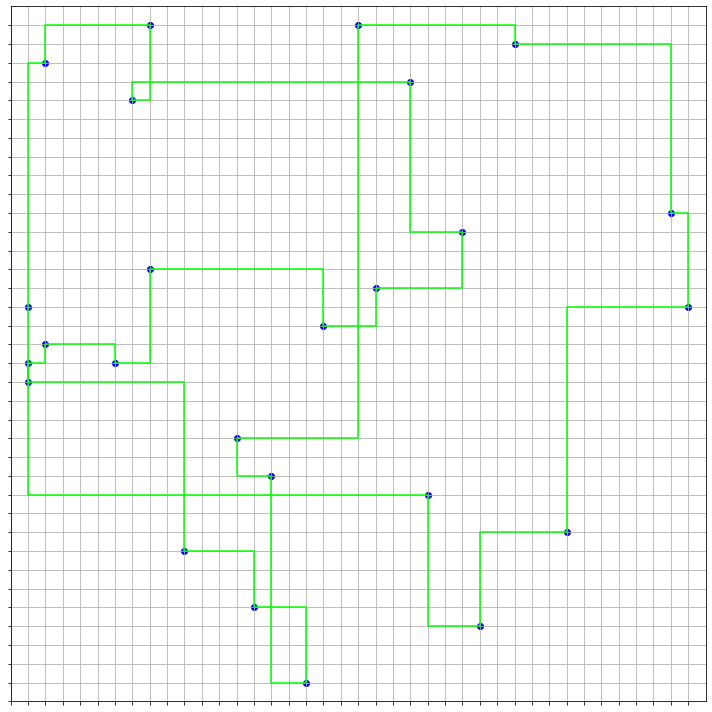

In [364]:
hc = HillClimb(100, l1_distance)
HTML(visualize_hillclimb(X, hc).to_jshtml())

### Задание 3 (4 балла)
Курьерское дело растет, теперь между городами блуждает большое количество курьеров, а их профессия вместе с известным маршрутом передается из поколение в поколение. Чем быстрее курьер способен обойти города - тем больше вероятность того, что он заработает себе на безоблачную старость и передаст свое дело потомкам. Симулируйте эволюцию курьеров, реализовав генетический алгоритм.

#### Методы
`optimize(X)` - выбирает лучшую перестановку из результатов `optimize_explain(X)`

`optimize_explain(X)` - возвращает список длины `iterations` популяций размера `population` перестановок точек `X`, полученных в процессе оптимизации. На каждом шаге алгоритм должен оставлять только `survivors` выживших, следующая популяция должна быть сгенерирована из них

In [490]:
class Genetic:
    def __init__(self, iterations, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iterations
    
    def optimize(self, X):
        populations = self.optimize_explain(X)
        
        return populations[-1]
    
    def fitness(self, X, P):
        return [cyclic_distance(X[p], self.dist) for p in P]
    
    def crossover(self, elite_paths):
        N = self.pop_size - self.surv_size
        
        new_population = [p for p in elite_paths]
        crossover_parts = np.random.randint(elite_paths[0].shape[0], size=(N, 2))
    
        for i, j in crossover_parts:
            parent1, parent2 = random.randint(0, self.surv_size - 1), random.randint(0, self.surv_size - 1)
            
            child_part1 = elite_paths[parent1][i:j]
            child_part2 = [p for p in elite_paths[parent2] if p not in child_part1]

            new_population.append(np.concatenate([child_part1, child_part2]))

        assert len(new_population) == self.pop_size

        return self.mutate(np.array(new_population))
    
    def mutate(self, paths, p=0.5):
        N = X.shape[0]
        
        paths_mutate = paths.copy()
        for path in paths_mutate:
            if random.random() < p:
                i, j = random.randint(0, N - 1), random.randint(0, N - 1)
                path[i], path[j] = path[j], path[i]
        
        return paths_mutate
    
    def optimize_explain(self, X):
        population = np.array([np.random.permutation(np.arange(X.shape[0])) for _ in range(self.pop_size)])
        
        history = []
        
        best_score = np.inf
        for i in range(self.iters):
            score = self.fitness(X, population)
            elites = population[np.argsort(score)[:self.surv_size]]
            population = self.crossover(elites)
            
            best_score = min(best_score, np.max(score))
            
            history.append(population.copy())

        return history

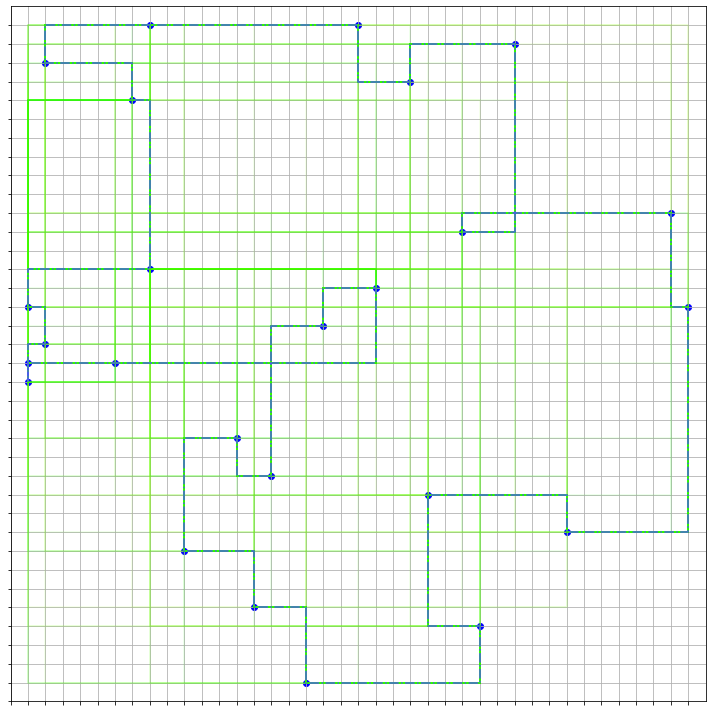

In [491]:
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())